# Analysis of data at 72h

## insert in barcode assignment table, the morphotype information

In [1]:
library(ggplot2)

Warning message:
“replacing previous import ‘lifecycle::last_warnings’ by ‘rlang::last_warnings’ when loading ‘tibble’”


In [2]:

barcode_assignment_72h <- readRDS("./files/demultiplexing/barcode_assignment_72h.rds")
head(barcode_assignment_72h)
dim(barcode_assignment_72h)



,cell,Bar1,Bar2,Bar3,Bar4,Bar5,Bar6,Bar7,Bar8,Bar9,⋯,Bar40,Bar41,Bar42,Bar43,Bar44,Bar45,Bar46,Bar47,Bar48,V1
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
1,AAACCCACATTGTCGA,5,3,1615,4,6,5,4,2,4,⋯,4,1,1,1,6,3,6,9,4,Bar3
2,AAACCCAGTAGTCTTG,2,1,9,0,5,11,1,4,4,⋯,3,1,4,1,6,5,9,14,4,Bar32
3,AAACCCAGTCCTCATC,3,1,2,1,5,4,1,2,2,⋯,0,6,2,3,7,0,4,3,4,Bar29
4,AAACCCAGTGATGTAA,3,2,6,2,5,4,2,1,3,⋯,1,0,1,5,3,1,6,9,4,Bar25
5,AAACCCATCCAGCAAT,7,2,10,5,9,5,3,7,4,⋯,1,1,5,1,4,2,70,7,4,Bar37
6,AAACGAAAGCGGTAGT,3,2,5,1,6,5,1,2,4,⋯,1,2,1,2,102,2,5,6,2,Bar44


[1] 10454    50

In [3]:
dim(barcode_assignment_72h)
# Remove negative and doublet cells
Negative<-which(grepl("Negative", barcode_assignment_72h$V1))
barcode_assignment_72h<-barcode_assignment_72h[-c(Negative),]
Doublet<-which(grepl("Doublet", barcode_assignment_72h$V1))
barcode_assignment_72h<-barcode_assignment_72h[-c(Doublet),]
dim(barcode_assignment_72h)

[1] 10454    50

[1] 7460   50

In [4]:
phenoTable_72h <- readRDS("./files/demultiplexing/PhenoTable_after_demultiplexing_72h.rds")
head(phenoTable_72h)
dim(phenoTable_72h)

,bar,Sample,Multi_BC,Multi_BC_#,Plate,Morphotype,Area,AR,barcodes,experiment,n_cells
,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<int>
1,Bar1,A2,CCTTGGCACCCGAGAATTCCACCACAATGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,A2,3,round,91158.38,1.103,CCACAATG,72h,102
2,Bar10,B5,CCTTGGCACCCGAGAATTCCAATAGCGTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B5,3,round,83081.62,1.014,ATAGCGTC,72h,183
3,Bar11,B6,CCTTGGCACCCGAGAATTCCAGAATCTCGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B6,3,round,79315.50,1.093,GAATCTCG,72h,135
4,Bar12,B7,CCTTGGCACCCGAGAATTCCACTAGCTGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,B7,3,round,86061.25,1.028,CTAGCTGA,72h,179
5,Bar13,C2,CCTTGGCACCCGAGAATTCCAACATGCGTAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,C2,3,round,84563.88,1.036,ACATGCGT,72h,104
6,Bar14,C3,CCTTGGCACCCGAGAATTCCATAAGGCTCAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA,C3,3,round,88885.08,1.029,TAAGGCTC,72h,90


[1] 47 11

In [5]:
# for 72h is eary because all of them are round

In [6]:
barcode_assignment_72h$Morphotype <- "round"

In [7]:
# add '-1' to cell column to match later with seurat 
barcode_assignment_72h$cell_barcode <- paste(barcode_assignment_72h$cell, '-1', sep = "")


# SEURAT

In [8]:
library(Seurat)

Attaching SeuratObject



In [9]:
# Load data
data_10X <- Read10X(data.dir = './raw_data/cellranger_results/cr-count_mm10_JV-RNA-2/outs/filtered_feature_bc_matrix/')
Gastruloid_72h <- CreateSeuratObject(counts=data_10X, project='Gastruloid_72h', min.cells=3, min.features=200)

head(Gastruloid_72h)
dim(Gastruloid_72h) # 13762 cells

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
AAACCCACACGTCATA-1,Gastruloid_72h,1283,468
AAACCCACATCCTTGC-1,Gastruloid_72h,789,486
AAACCCACATTAAGCC-1,Gastruloid_72h,1481,818
AAACCCACATTGTCGA-1,Gastruloid_72h,939,545
AAACCCAGTAGTCTTG-1,Gastruloid_72h,1137,557
AAACCCAGTCCTCATC-1,Gastruloid_72h,43703,6475
AAACCCAGTGATGTAA-1,Gastruloid_72h,28463,5255
AAACCCATCATTTACC-1,Gastruloid_72h,796,492
AAACCCATCCAGCAAT-1,Gastruloid_72h,2004,962


[1] 20186 13762

In [10]:
Gastruloid_72h <- subset(x = Gastruloid_72h, cells = barcode_assignment_72h$cell_barcode)
dim(Gastruloid_72h) # 7459 cells


[1] 20186  7459

In [11]:
metadata_72h <- barcode_assignment_72h[barcode_assignment_72h$cell_barcode %in% rownames(Gastruloid_72h@meta.data),]
head(metadata_72h)


,cell,Bar1,Bar2,Bar3,Bar4,Bar5,Bar6,Bar7,Bar8,Bar9,⋯,Bar42,Bar43,Bar44,Bar45,Bar46,Bar47,Bar48,V1,Morphotype,cell_barcode
,<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>
1,AAACCCACATTGTCGA,5,3,1615,4,6,5,4,2,4,⋯,1,1,6,3,6,9,4,Bar3,round,AAACCCACATTGTCGA-1
2,AAACCCAGTAGTCTTG,2,1,9,0,5,11,1,4,4,⋯,4,1,6,5,9,14,4,Bar32,round,AAACCCAGTAGTCTTG-1
3,AAACCCAGTCCTCATC,3,1,2,1,5,4,1,2,2,⋯,2,3,7,0,4,3,4,Bar29,round,AAACCCAGTCCTCATC-1
4,AAACCCAGTGATGTAA,3,2,6,2,5,4,2,1,3,⋯,1,5,3,1,6,9,4,Bar25,round,AAACCCAGTGATGTAA-1
5,AAACCCATCCAGCAAT,7,2,10,5,9,5,3,7,4,⋯,5,1,4,2,70,7,4,Bar37,round,AAACCCATCCAGCAAT-1
6,AAACGAAAGCGGTAGT,3,2,5,1,6,5,1,2,4,⋯,1,2,102,2,5,6,2,Bar44,round,AAACGAAAGCGGTAGT-1


In [12]:
# add metadata information

In [13]:
Gastruloid_72h <- AddMetaData(object = Gastruloid_72h, metadata = metadata_72h$V1, col.name = 'Sample.barcode')
Gastruloid_72h <- AddMetaData(object = Gastruloid_72h, metadata = metadata_72h$Morphotype, col.name = 'Morphotype')
head(Gastruloid_72h@meta.data)
dim(Gastruloid_72h) # 7459 cells

,orig.ident,nCount_RNA,nFeature_RNA,Sample.barcode,Morphotype
,<fct>,<dbl>,<int>,<chr>,<chr>
AAACCCACATTGTCGA-1,Gastruloid_72h,939,545,Bar3,round
AAACCCAGTAGTCTTG-1,Gastruloid_72h,1137,557,Bar32,round
AAACCCAGTCCTCATC-1,Gastruloid_72h,43703,6475,Bar29,round
AAACCCAGTGATGTAA-1,Gastruloid_72h,28463,5255,Bar25,round
AAACCCATCCAGCAAT-1,Gastruloid_72h,2004,962,Bar37,round
AAACGAAAGCGGTAGT-1,Gastruloid_72h,19810,4081,Bar44,round


[1] 20186  7459

In [14]:
# order sample barcode numerically
library(stringr)

myLevels <- c(data.frame(table(Gastruloid_72h@meta.data$Sample.barcode))$Var1)
myLevels <- str_sort(myLevels, numeric = TRUE)
head(myLevels)

#factor(Gastruloid_48h@meta.data$Sample.barcode, levels= myLevels)
Gastruloid_72h@meta.data$Sample.barcode <- factor(Gastruloid_72h@meta.data$Sample.barcode, levels= myLevels)


[1] "Bar1" "Bar2" "Bar3" "Bar4" "Bar5" "Bar6"

## Metadata table

In [15]:
metadata_72h <- Gastruloid_72h@meta.data

## QC

### Before QC (all samples together)

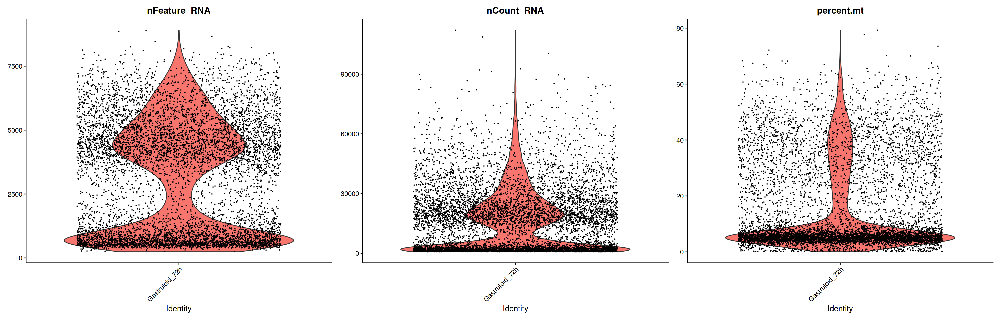

In [16]:
# QC, normalize and scale
library(repr)


Gastruloid_72h[["percent.mt"]] <- PercentageFeatureSet(Gastruloid_72h, pattern = "^mt-")

options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_72h, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

Warning message:
“Removed 1 rows containing missing values (geom_hline).”
Warning message:
“Removed 1 rows containing missing values (geom_hline).”
Warning message:
“Removed 1 rows containing missing values (geom_hline).”


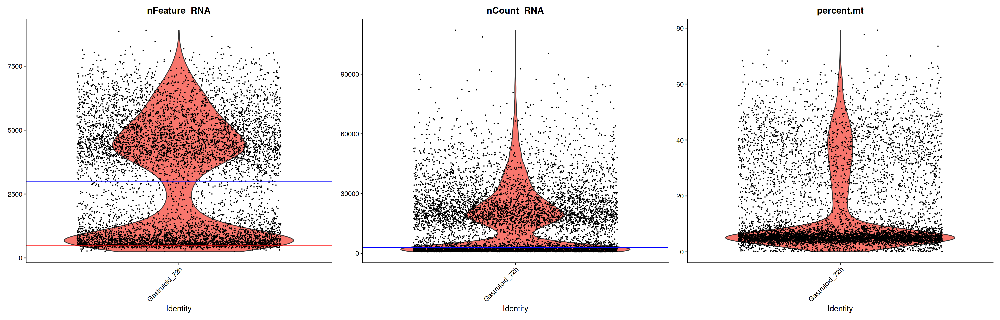

In [17]:
library(ggplot2)
VlnPlot(Gastruloid_72h, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3) & geom_hline(yintercept = 500, color="red") & geom_hline(yintercept = 3000, color="blue")

### Before QC (individual samples)

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



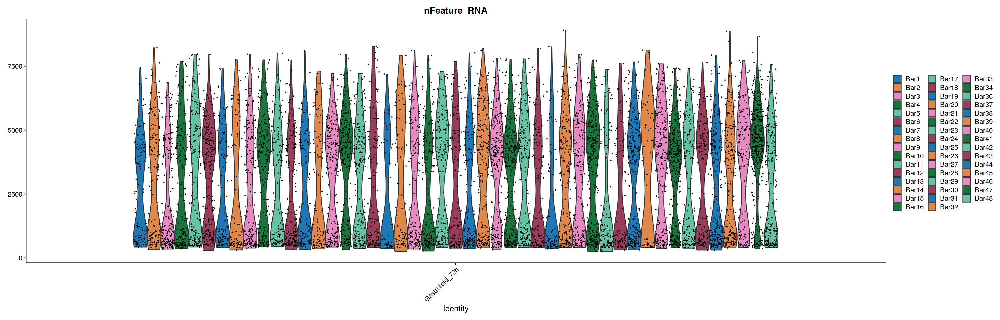

In [18]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_72h, features = c("nFeature_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

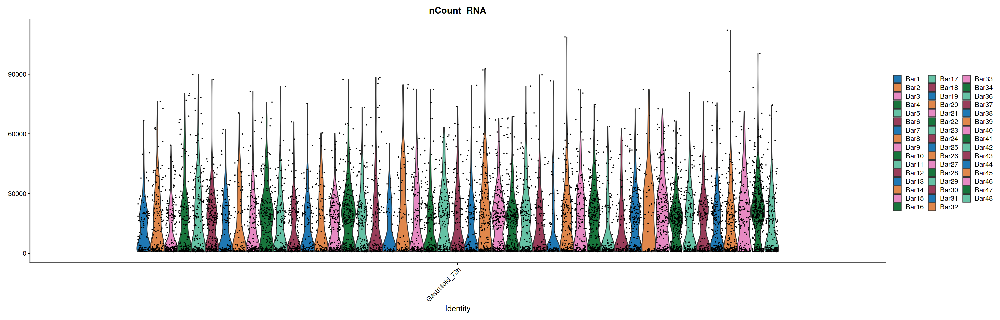

In [19]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_72h, features = c("nCount_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

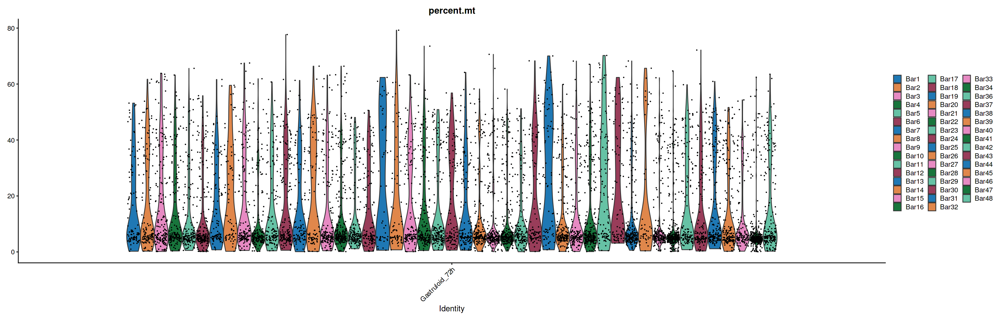

In [20]:
# Change plot size to 8 x 3
options(repr.plot.width=25, repr.plot.height=8)
VlnPlot(Gastruloid_72h, features = c("percent.mt"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

In [21]:
library(ggplot2)
# theme
source("https://gist.githubusercontent.com/benmarwick/2a1bb0133ff568cbe28d/raw/fb53bd97121f7f9ce947837ef1a4c65a73bffb3f/geom_flat_violin.R")
theme_niwot <- function(){
  theme_bw() +
    theme(text = element_text(family = "Helvetica Light"),
          axis.text = element_text(size = 16),
          axis.title = element_text(size = 18),
          axis.line.x = element_line(color="black"),
          axis.line.y = element_line(color="black"),
          panel.border = element_blank(),
          panel.grid.major.x = element_blank(),
          panel.grid.minor.x = element_blank(),
          panel.grid.minor.y = element_blank(),
          panel.grid.major.y = element_blank(),
          plot.margin = unit(c(1, 1, 1, 1), units = , "cm"),
          plot.title = element_text(size = 18, vjust = 1, hjust = 0),
          legend.text = element_text(size = 12),
          legend.title = element_blank(),
          legend.position = "right",
          legend.key = element_blank(),
          legend.background = element_rect(color = "black",
                                           fill = "transparent",
                                           size = 2, linetype = "blank"))}


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [22]:
colours <- rep(c('#e41a1c',
'#377eb8',
'#4daf4a',
'#984ea3',
'#ff7f00'), 100)
length(colours)
 # n = number of colors seeked

[1] 500

In [23]:
cellnumber_beforeQC <- c(data.frame(table(metadata_72h$Sample.barcode))$Freq)
#cellnumber_beforeQC

labels_beforeQC <- paste(c(data.frame(table(metadata_72h$Sample.barcode))$Var1), c(data.frame(table(metadata_72h$Sample.barcode))$Freq), sep="-")
#metadata_48h

dim(metadata_72h)

[1] 7459    5

### Before QC (individual samples) > ggplot

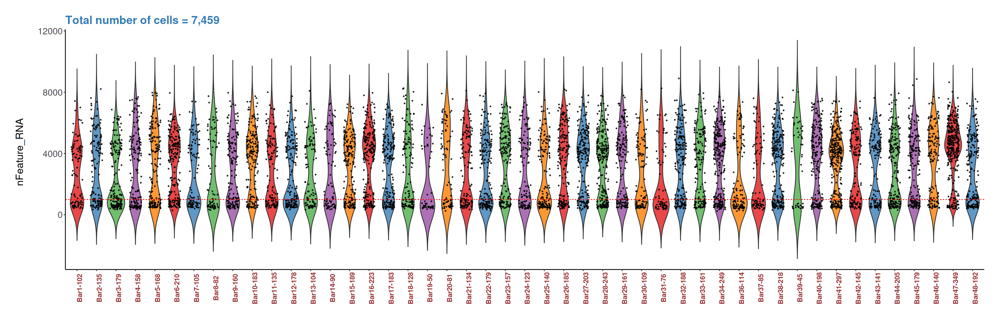

In [24]:
ggplot(data = metadata_72h, 
       aes(x = Sample.barcode, y = (nFeature_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nFeature_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nFeature_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_beforeQC)) +
  theme_niwot() +
  geom_hline(yintercept=1000, linetype="dashed", color = "red") +
  ggtitle("Total number of cells = 7,459") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

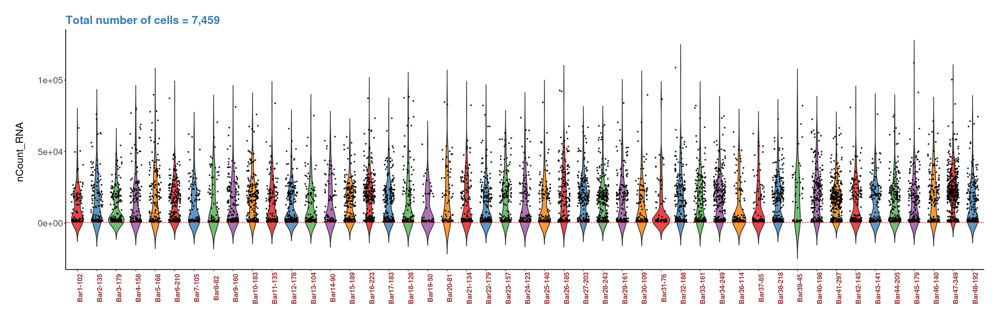

In [26]:
ggplot(data = metadata_72h, 
       aes(x = Sample.barcode, y = (nCount_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nCount_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nCount_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_beforeQC)) +
  theme_niwot() +  
  geom_hline(yintercept=500, linetype="dashed", color = "red")+
  ggtitle("Total number of cells = 7,459") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

### After QC (all samples together)

[1] 20186  2361

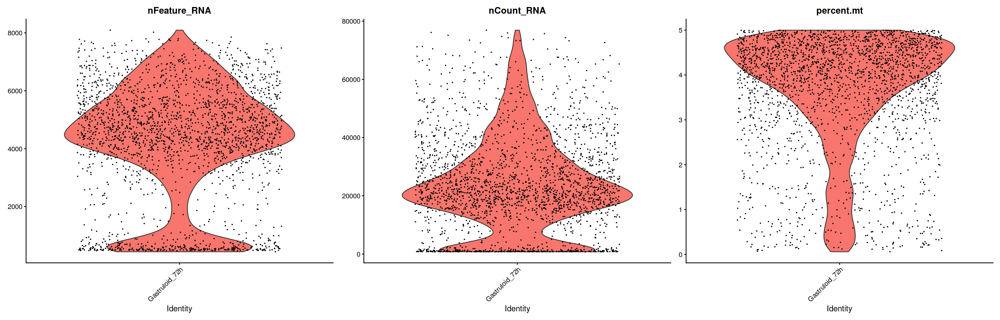

In [29]:
Gastruloid_72h_afterQC <- subset(Gastruloid_72h, subset = nCount_RNA > 500 & nCount_RNA < 80000 & percent.mt < 5)
dim(Gastruloid_72h_afterQC)

VlnPlot(Gastruloid_72h_afterQC, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

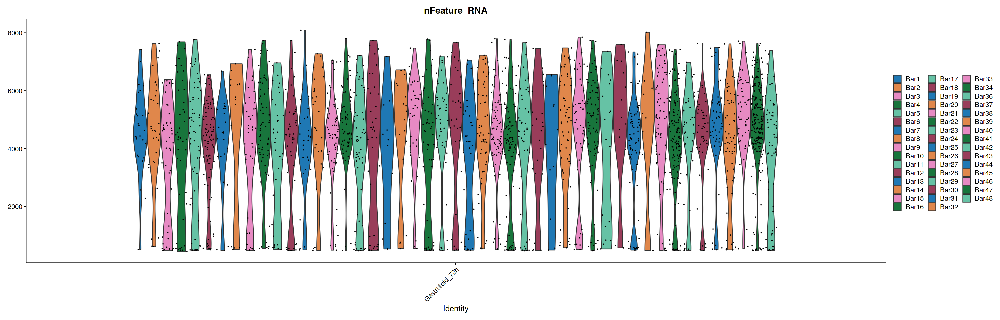

In [30]:
VlnPlot(Gastruloid_72h_afterQC, features = c("nFeature_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

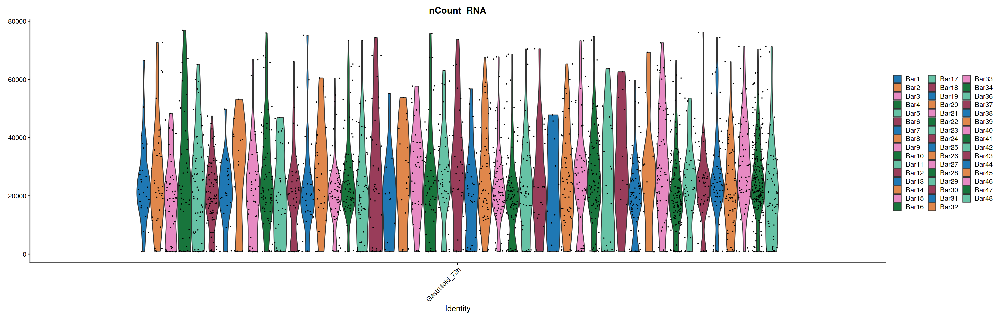

In [31]:
VlnPlot(Gastruloid_72h_afterQC, features = c("nCount_RNA"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

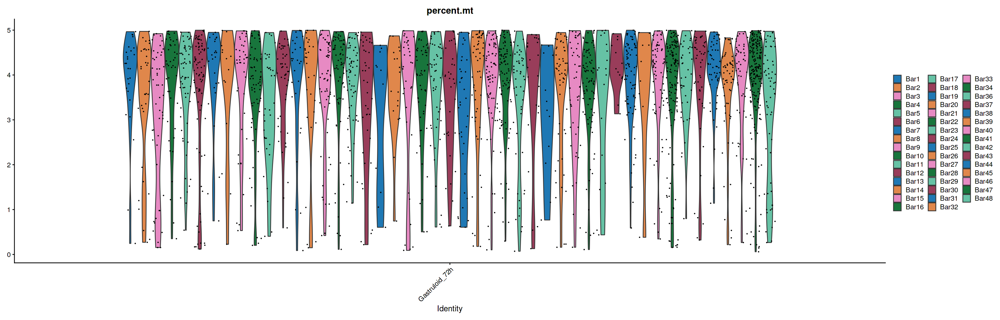

In [32]:
VlnPlot(Gastruloid_72h_afterQC, features = c("percent.mt"),
        split.by = "Sample.barcode", cols = c('#1f78b4', '#e78ac3', '#66c2a5'))

In [33]:
metadata_72h_afterQC <- Gastruloid_72h_afterQC@meta.data
head(metadata_72h_afterQC)
colnames(metadata_72h_afterQC)
dim(metadata_72h_afterQC)

,orig.ident,nCount_RNA,nFeature_RNA,Sample.barcode,Morphotype,percent.mt
,<fct>,<dbl>,<int>,<fct>,<chr>,<dbl>
AAACCCACATTGTCGA-1,Gastruloid_72h,939,545,Bar3,round,2.768903
AAACCCAGTCCTCATC-1,Gastruloid_72h,43703,6475,Bar29,round,4.358968
AAACGAAAGCGGTAGT-1,Gastruloid_72h,19810,4081,Bar44,round,4.558304
AAACGAATCTCCTGAC-1,Gastruloid_72h,836,497,Bar25,round,1.794258
AAACGCTAGACCAAGC-1,Gastruloid_72h,17846,4447,Bar45,round,3.905637
AAACGCTCACTTGGCG-1,Gastruloid_72h,40210,6070,Bar18,round,4.956478


[1] "orig.ident"     "nCount_RNA"     "nFeature_RNA"   "Sample.barcode"
[5] "Morphotype"     "percent.mt"

[1] 2361    6

,Var1,Freq
,<fct>,<int>
1,Bar1,26
2,Bar2,34
3,Bar3,49
4,Bar4,42
5,Bar5,59
6,Bar6,83


[1] 48

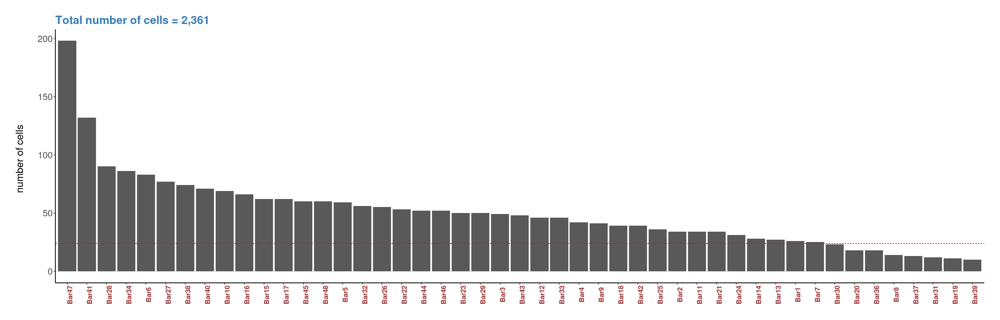

In [48]:
x <- data.frame(table(metadata_72h_afterQC$Sample.barcode))
head(x)
median(x$Freq)

# Barplot
ggplot(x, aes(x=reorder(Var1, -Freq), y=Freq)) + 
  geom_bar(stat = "identity")+
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "number of cells  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  theme_niwot() +
  geom_hline(yintercept=median(x$Freq)/2, linetype="dashed", color = "red") +
  ggtitle("Total number of cells = 2,361") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))

In [49]:

# order sample barcode numerically
library(stringr)

myLevels <- c(data.frame(table(metadata_72h_afterQC$Sample.barcode))$Var1)
myLevels <- str_sort(myLevels, numeric = TRUE)
head(myLevels)

metadata_72h_afterQC$Sample.barcode <- factor(metadata_72h_afterQC$Sample.barcode, levels= myLevels)
levels(metadata_72h_afterQC$Sample.barcode)



[1] "Bar1" "Bar2" "Bar3" "Bar4" "Bar5" "Bar6"

[1] "Bar1"  "Bar2"  "Bar3"  "Bar4"  "Bar5"  "Bar6"  "Bar7"  "Bar8"  "Bar9" 
[10] "Bar10" "Bar11" "Bar12" "Bar13" "Bar14" "Bar15" "Bar16" "Bar17" "Bar18"
[19] "Bar19" "Bar20" "Bar21" "Bar22" "Bar23" "Bar24" "Bar25" "Bar26" "Bar27"
[28] "Bar28" "Bar29" "Bar30" "Bar31" "Bar32" "Bar33" "Bar34" "Bar36" "Bar37"
[37] "Bar38" "Bar39" "Bar40" "Bar41" "Bar42" "Bar43" "Bar44" "Bar45" "Bar46"
[46] "Bar47" "Bar48"

In [54]:
dim(metadata_72h_afterQC)

[1] 2361    6

In [50]:
myLevels <- c(data.frame(table(Gastruloid_72h_afterQC@meta.data$Sample.barcode))$Var1)
myLevels <- str_sort(myLevels, numeric = TRUE)
head(myLevels)

Gastruloid_72h_afterQC@meta.data$Sample.barcode <- factor(Gastruloid_72h_afterQC@meta.data$Sample.barcode, levels= myLevels)

[1] "Bar1" "Bar2" "Bar3" "Bar4" "Bar5" "Bar6"

In [51]:
levels(Gastruloid_72h_afterQC@meta.data$Sample.barcode)

[1] "Bar1"  "Bar2"  "Bar3"  "Bar4"  "Bar5"  "Bar6"  "Bar7"  "Bar8"  "Bar9" 
[10] "Bar10" "Bar11" "Bar12" "Bar13" "Bar14" "Bar15" "Bar16" "Bar17" "Bar18"
[19] "Bar19" "Bar20" "Bar21" "Bar22" "Bar23" "Bar24" "Bar25" "Bar26" "Bar27"
[28] "Bar28" "Bar29" "Bar30" "Bar31" "Bar32" "Bar33" "Bar34" "Bar36" "Bar37"
[37] "Bar38" "Bar39" "Bar40" "Bar41" "Bar42" "Bar43" "Bar44" "Bar45" "Bar46"
[46] "Bar47" "Bar48"

In [52]:
cellnumber_afterQC <- c(data.frame(table(metadata_72h_afterQC$Sample.barcode))$Freq)
#cellnumber_afterQC

labels_afterQC <- paste(c(data.frame(table(metadata_72h_afterQC$Sample.barcode))$Var1), c(data.frame(table(metadata_72h_afterQC$Sample.barcode))$Freq), sep="-")
#labels_afterQC

### After QC (individual samples) > ggplot

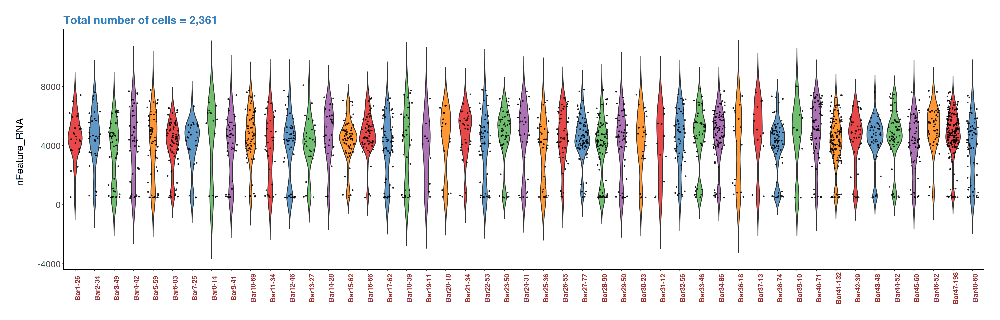

In [55]:
ggplot(data = metadata_72h_afterQC, 
       aes(x = Sample.barcode, y = (nFeature_RNA), fill= Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nFeature_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nFeature_RNA  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_afterQC)) +
  theme_niwot() +
  ggtitle("Total number of cells = 2,361") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))



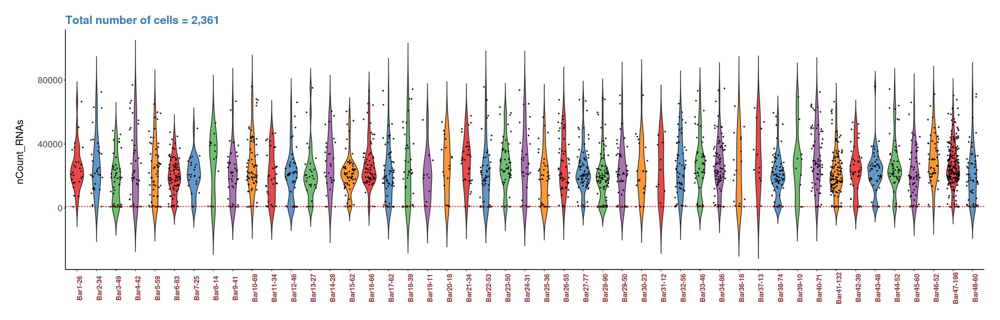

In [57]:
ggplot(data = metadata_72h_afterQC, 
       aes(x = Sample.barcode, y = (nCount_RNA), fill = Sample.barcode)) +
  # The half violins
  geom_violin(position = position_nudge(x = 0, y = 0), alpha = 0.8, trim=FALSE) +
  # The points
  geom_point(aes(y = (nCount_RNA)),
             position = position_jitter(width = 0.3), size = 0.4, alpha = 0.8) +
  # The boxplots
  # geom_boxplot(width = 0.2, outlier.shape = NA, alpha = 0.6) +
  # \n adds a new line which creates some space between the axis and axis title
  labs(y = "nCount_RNAs  \n", x = NULL) +
  # Removing legends
  guides(fill = FALSE, color = FALSE) +
  # Setting the limits of the y axis
  #scale_y_continuous(limits = c(25, 40)) +
  # Picking nicer colours
  scale_fill_manual(values = colours) +
  scale_x_discrete(labels=as.character(labels_afterQC)) +
  theme_niwot() +  
  geom_hline(yintercept=1000, linetype="dashed", color = "red")+
  ggtitle("Total number of cells = 2,361") +
  theme(axis.text.x = element_text(face="bold", color="#993333", 
                           size=12, angle=90),
       plot.title = element_text(color="#377eb8", size=20, face="bold"))






# Saving Seurat object & metadata info (after QC)

In [58]:
# Save the files
saveRDS(Gastruloid_72h_afterQC, file = "./files/Seurat_Obj_afterQC/Gastruloid_72h_afterQC.rds")
saveRDS(metadata_72h_afterQC, file = "./files/Seurat_Obj_afterQC/metadata_72h_afterQC.rds")